# Massive Post on Image Processing And Preparation For Deep Learning in Python
## Manipulate and transform images at will
![](images/unsplash.jpg)
<figcaption style="text-align: center;">
    <strong>
        Photo by 
        <a href='https://unsplash.com/@pkprasad1996?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText'>Prasad Panchakshari</a>
        on 
        <a href='https://unsplash.com/s/photos/kitten?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText'>Unsplash</a>
    </strong>
</figcaption>

## Introduction

We are here on a sad business. Very sad, indeed. We are here to learn how to take beautiful, breathtaking images and turn them into bunch of ugly little numbers so that they are more presentable to all those soulless, mindless machines. 

## Setup

In [154]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage  # pip install scikit-image

warnings.filterwarnings("ignore")

In [155]:
def show(image: np.ndarray, title="Image", cmap_type="gray", axis=False):
    """
    A function to display np.ndarrays as images
    """
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    if not axis:
        plt.axis("off")
    plt.margins(0, 0)
    plt.show();

In [207]:
def compare(
    original,
    filtered,
    title_filtered="Filtered",
    cmap_type="gray",
    axis=False,
    title_original="Original",
):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)

    ax1.imshow(original, cmap=cmap_type)
    ax1.set_title(title_original)

    ax2.imshow(filtered, cmap=cmap_type)
    ax2.set_title(title_filtered)

    if not axis:
        ax1.axis("off")
        ax2.axis("off")
    plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0.01)
    plt.margins(0, 0)
    plt.show();

## Basics

### 1. Image basics with NumPy and Skimage

Images are loaded as NumPy ndarrays in both Matplotlib and Skimage. 

In [210]:
from skimage.io import imread  # pip install scikit-image

image = imread("images/colorful_scenery.jpg")

type(image)

numpy.ndarray

As always, NumPy arrays bring flexibility, speed and power into the game. Image processing is no different. 

Ndarrays make it easy to retrieve general details about the image, like its dimensions:

In [158]:
image.shape

(853, 1280, 3)

In [208]:
image.ndim

3

In [159]:
# The number of pixels
image.size  # 853 * 1280 * 3

3275520

Our hidden `image` contains 853 pixels in height and 1280 in width. The third dimension denotes the value of the RGB (red, green, blue) color channel. All colored images are in 3D. 

You can retrieve individual pixel values via regular NumPy indexing. Below, we try to index the image to retrieve each of the three color channels:

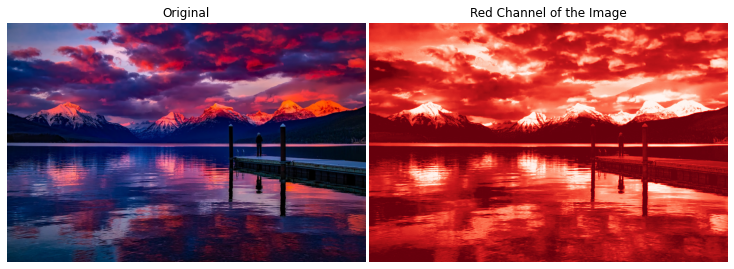

In [160]:
red = image[:, :, 0]

compare(image, red, "Red Channel of the Image", cmap_type="Reds_r")

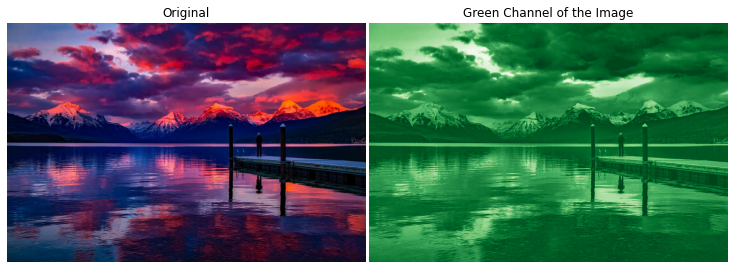

In [161]:
green = image[:, :, 1]

compare(image, green, "Green Channel of the Image", "Greens_r")

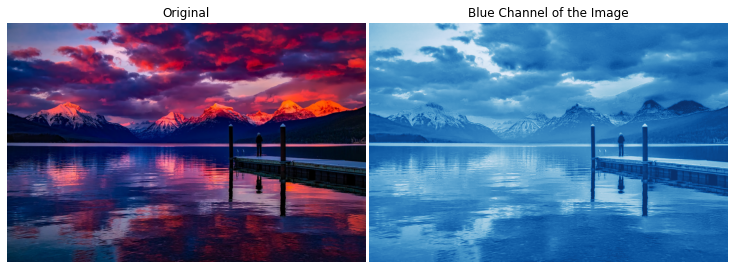

In [162]:
blue = image[:, :, 2]

compare(image, blue, "Blue Channel of the Image", "Blues_r")

1 for red, 2 for green and 3 for blue channel - easy enough. 

I've created two functions, [`show`](https://gist.github.com/BexTuychiev/e65c222f6fa388b22d7cf80eb561a1f4) and [`compare`]() which show an image or display two of them side by side for comparison. We will be using both functions extensively throughout the tutorial, so you might want to check out their code I hyperlinked.

By convention, the third dimension of the ndarray is for the color channel but this convention isn't always followed. Whenever you find it so, Skimage usually provides parameters to specify this behavior. 

Images are unlike the usual Matplotlib plots. Their origin isn't located in the bottom left, but at the position `(0, 0)`, the top left.

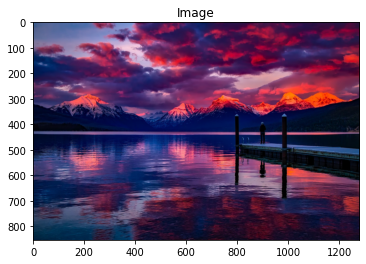

In [211]:
show(image, axis=True)

When we plot images in Matplotlib, axes denote the ordering of the pixels but we will usually be hiding them, since they don't deliver much value to the viewer.

### 2. Common transformations

The most common image transformation we will be performing is converting color images to grayscale. Many image processing algorithms require grayscale, 2D arrays because color isn't the defining feature of images and computers can already extract enough information without it.

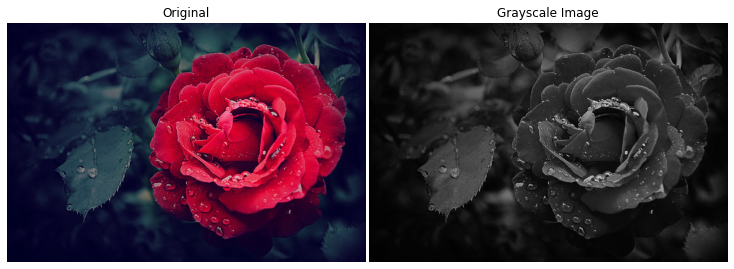

In [163]:
from skimage.color import rgb2gray

image = imread("images/grayscale_example.jpg")
# Convert image to grayscale
gray = rgb2gray(image)

compare(image, gray, "Grayscale Image")

In [212]:
gray.shape

(853, 1280)

When we convert images to grayscale, they lose their 3rd dimension - the color channel. Instead, each cell in the image array now represents an integer in `uint8` type. They range from 0 to 255, giving 256 shades of gray. 

You can also use NumPy functions like `np.flipud` or `np.fliplr` at your heart's desire to manipulate images in any way a NumPy can be manipulated.

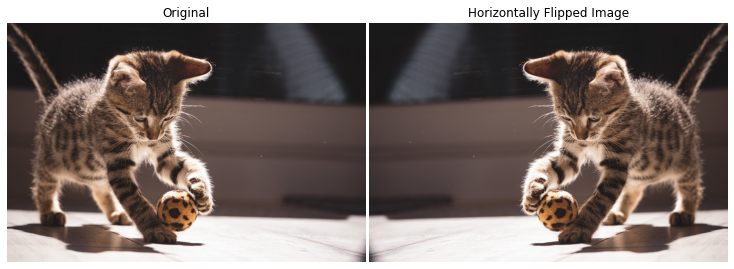

In [164]:
kitten = imread("images/horizontal_flip.jpg")
horizontal_flipped = np.fliplr(kitten)

compare(kitten, horizontal_flipped, "Horizontally Flipped Image")

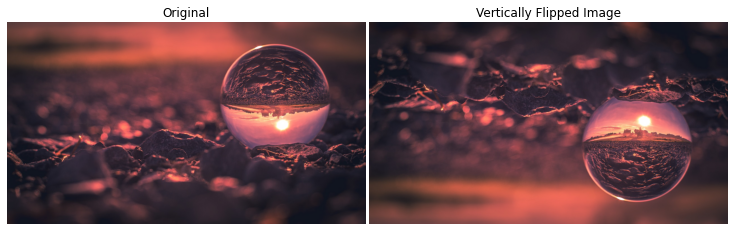

In [165]:
ball = imread("images/upside_down.jpg")
vertically_flipped = np.flipud(ball)

compare(ball, vertically_flipped, "Vertically Flipped Image")

In the [`color` module](https://scikit-image.org/docs/dev/api/skimage.color.html), you can find many other transformation functions to work with colors in images.

### 3. Histogram of color channels

Sometimes, it is useful to look at the intensity of each color channel to get a feel of the color distributions. We can do so by slicing each color channel and plotting their histograms. Here is a function to perform this operation:

In [213]:
def plot_with_hist_channel(image, channel):
    channels = ["red", "green", "blue"]
    channel_idx = channels.index(channel)
    color = channels[channel_idx]

    extracted_channel = image[:, :, channel_idx]
    fig, (ax1, ax2) = plt.subplots(
        ncols=2, figsize=(18, 6)
    )  # , sharex=True, sharey=True)

    ax1.imshow(image)
    ax1.axis("off")
    ax2.hist(extracted_channel.ravel(), bins=256, color=color)
    ax2.set_title(f"{channels[channel_idx]} histogram")

Apart from the few Matplotlib details, you should pay attention to the call of the `hist` function. Once we extract the color channel and its array, we flatten it into 1D array and then pass it to the `hist` function. The number of bins should be 256, one for every pixel value - 0 being pitch black and 255 being fully white.

Let's use the function for our colorful scenery image:

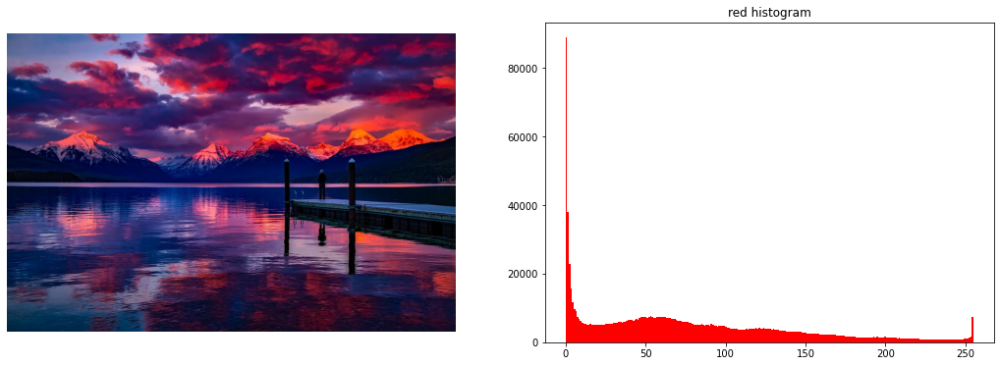

In [215]:
colorful_scenery = imread("images/colorful_scenery.jpg")

plot_with_hist_channel(colorful_scenery, "red")

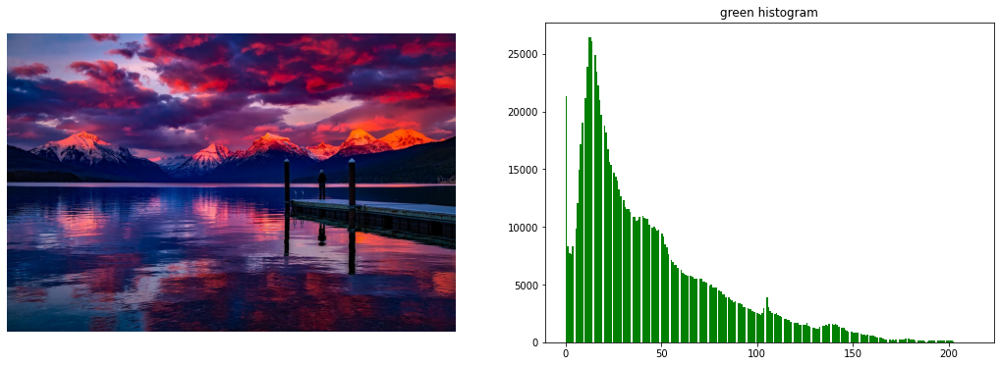

In [216]:
plot_with_hist_channel(colorful_scenery, "green")

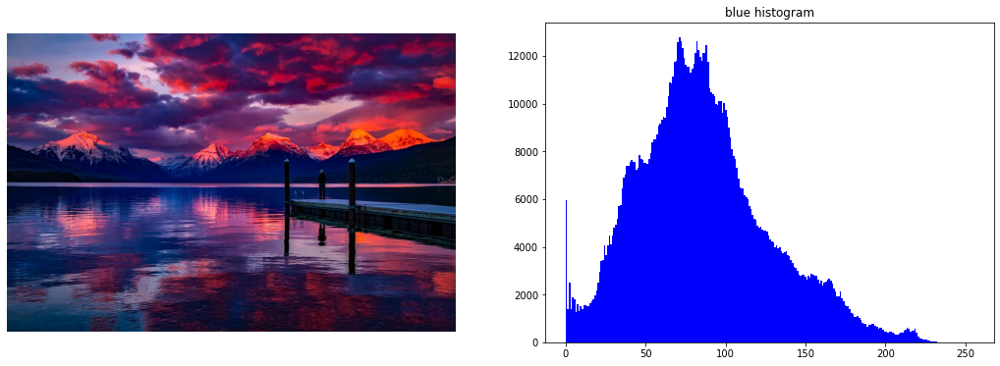

In [217]:
plot_with_hist_channel(colorful_scenery, "blue")

You can also use histograms to find out the lightness in the image after converting it to a grayscale:

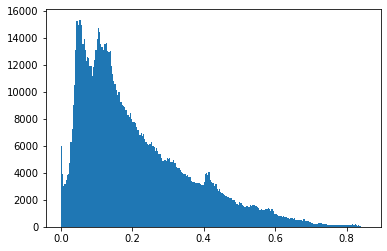

In [222]:
gray_color_scenery = rgb2gray(colorful_scenery)

plt.hist(gray_color_scenery.ravel(), bins=256);

Most pixels have lower values as the scenery image is a bit darker.

We will explore more applications of histograms in the next sections.

## Filters

### 1. Manual thresholding

In [171]:
stag = imread("images/binary_example.jpg")

# Convert to graysacle
stag_gray = rgb2gray(stag)

In [172]:
stag_gray.mean()

0.20056262759859955

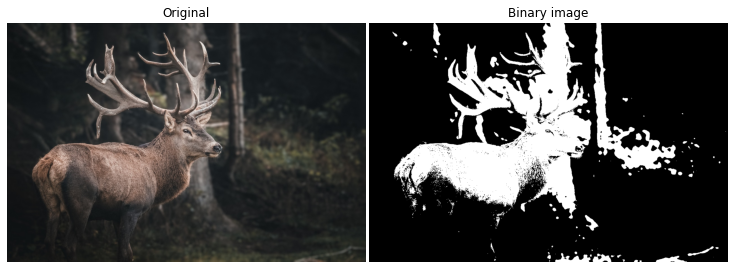

In [173]:
# Set threshold
threshold = 0.25
# Binarize
binary_image = stag_gray > threshold

compare(stag, binary_image, "Binary image")

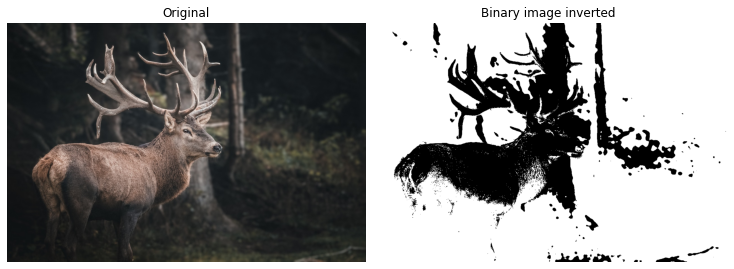

In [174]:
inverted_binary = stag_gray <= threshold

compare(stag, inverted_binary, "Binary image inverted")

### 2. Thresholding - global

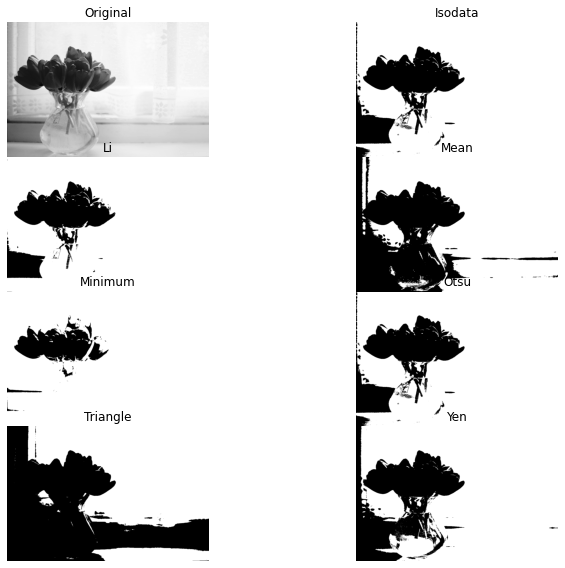

In [175]:
from skimage.filters import try_all_threshold

flower = imread("images/global_threshold_ex.jpg")
flower_gray = rgb2gray(flower)

fig, ax = try_all_threshold(flower_gray, figsize=(10, 8), verbose=False)
plt.subplots_adjust(wspace=0, hspace=0)

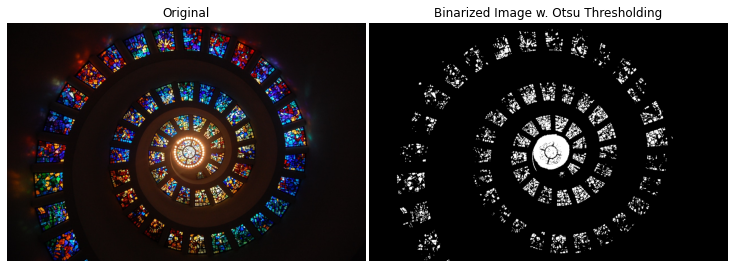

In [176]:
from skimage.filters import threshold_otsu

spiral = imread("images/otsu_example.jpg")
spiral_gray = rgb2gray(spiral)

# Find optimal threshold
threshold = threshold_otsu(spiral_gray)

# Binarize
binary_spiral = spiral_gray > threshold

compare(spiral, binary_spiral, "Binarized Image w. Otsu Thresholding")

### 3. Thresholding - local

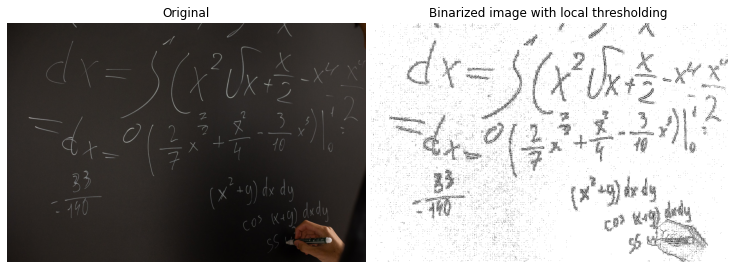

In [177]:
from skimage.filters import threshold_local

handwriting = imread("images/chalk_writing.jpg")
handwriting_gray = rgb2gray(handwriting)

# Find optimal threshold using local
local_thresh = threshold_local(handwriting_gray, offset=0.0003)

# Binarize
binary_handwriting = handwriting_gray > local_thresh

compare(handwriting, binary_handwriting, "Binarized image with local thresholding")

### 4. Edge detection

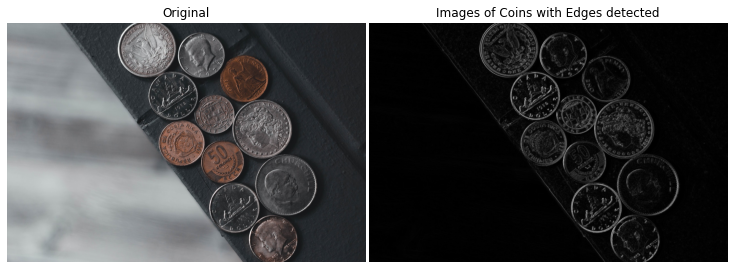

In [178]:
from skimage.feature import canny
from skimage.filters import sobel

coins = imread("images/coins_2.jpg")
coins_gray = rgb2gray(coins)

coins_edge = sobel(coins_gray)

compare(coins, coins_edge, "Images of Coins with Edges detected")

### 5. Smoothing

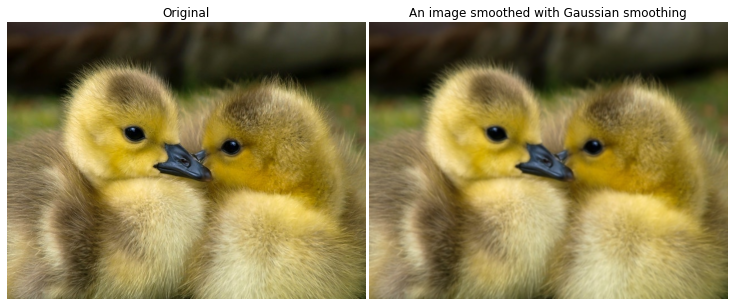

In [179]:
from skimage.filters import gaussian

chickens = imread("images/chickens.jpg")

smoothed = gaussian(chickens, multichannel=True)

compare(chickens, smoothed, "An image smoothed with Gaussian smoothing")

### 6. Contrast enhancement

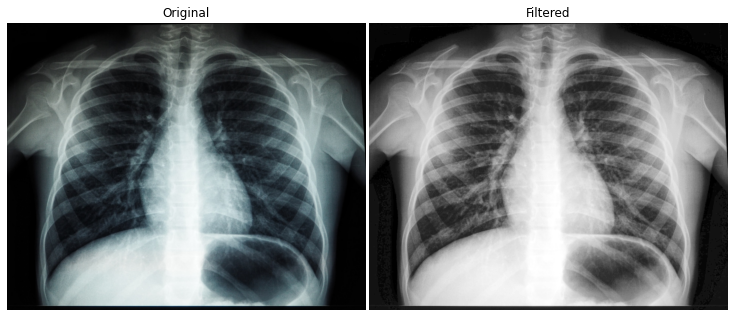

In [180]:
from skimage.exposure import equalize_hist

xray = imread("images/xray.jpg")
xray_gray = rgb2gray(xray)

enhanced = equalize_hist(xray_gray)

compare(xray, enhanced)

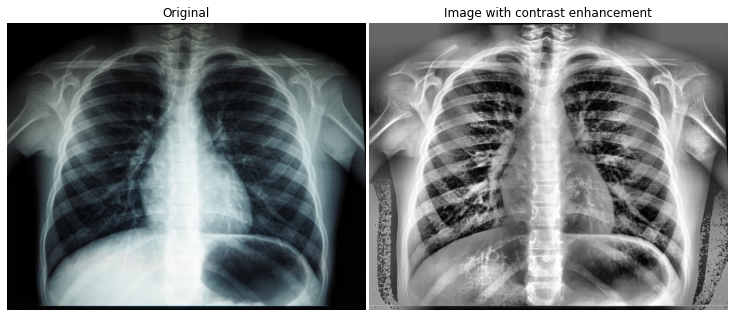

In [181]:
from skimage.exposure import equalize_adapthist

# Adjust clip_limit
enhanced_adaptive = equalize_adapthist(xray_gray, clip_limit=0.4)

compare(xray, enhanced_adaptive, "Image with contrast enhancement")

### 7. Transformations

**Rotations**

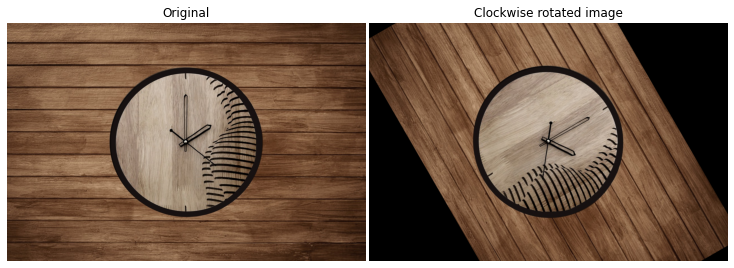

In [182]:
from skimage.transform import rotate

clock = imread("images/clock.jpg")

clockwise = rotate(clock, angle=-60)
compare(clock, clockwise, "Clockwise rotated image")

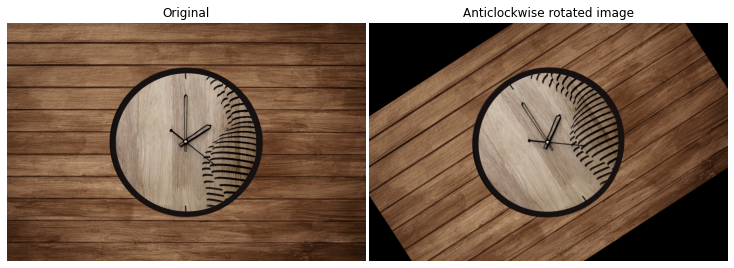

In [183]:
anti_clockwise = rotate(clock, angle=33)

compare(clock, anti_clockwise, "Anticlockwise rotated image")

**Rescaling**

In [184]:
from skimage.transform import rescale

butterflies = imread("images/butterflies.jpg")
butterflies.shape

(720, 1280, 3)

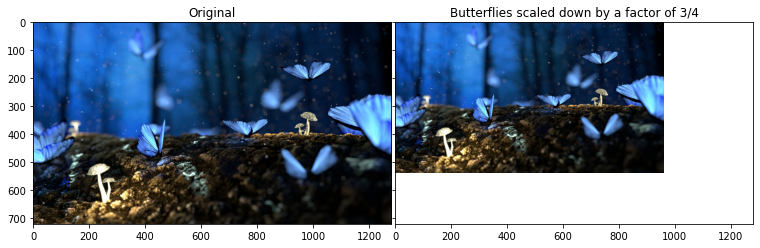

In [185]:
scaled_butterflies = rescale(butterflies, scale=3 / 4, multichannel=True)

compare(
    butterflies,
    scaled_butterflies,
    "Butterflies scaled down by a factor of 3/4",
    axis=True,
)

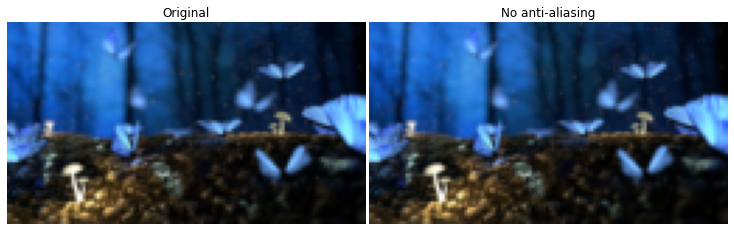

In [186]:
factor_10_aa = rescale(butterflies, scale=1 / 10, multichannel=True, anti_aliasing=True)
factor_10_no_aa = rescale(butterflies, scale=1 / 10, multichannel=True)

compare(factor_10_aa, factor_10_no_aa, "No anti-aliasing")

**Resizing**

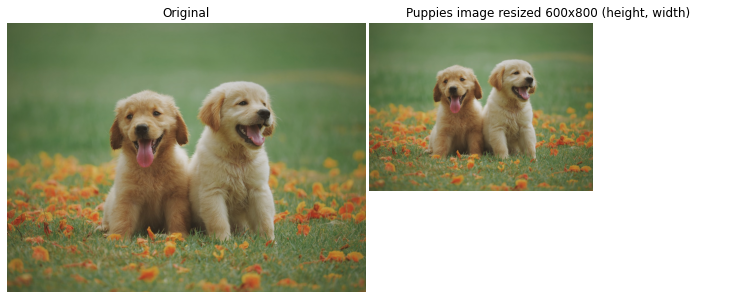

In [187]:
from skimage.transform import resize

puppies = imread("images/puppies.jpg")

# Also possible to set anti_aliasing
puppies_600_800 = resize(puppies, output_shape=(600, 800))

compare(puppies, puppies_600_800, "Puppies image resized 600x800 (height, width)")

## Image restoration and enhancement

### 1. Inpainting

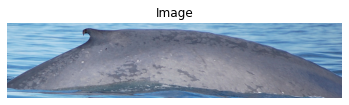

In [188]:
whale_image = imread("images/00206a224e68de.jpg")

show(whale_image)

In [189]:
whale_image.shape

(428, 1916, 3)

In [190]:
def make_mask(image):
    """Create a mask to artificially defect the image."""

    mask = np.zeros(image.shape[:-1])

    # Make 4 masks
    mask[250:300, 1400:1600] = 1
    mask[50:100, 300:433] = 1
    mask[300:380, 1000:1200] = 1
    mask[200:270, 750:950] = 1

    return mask.astype(bool)

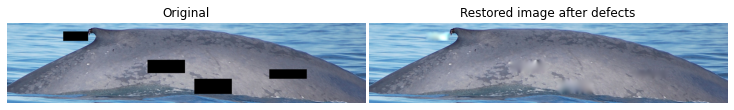

In [191]:
from skimage.restoration import inpaint

# Create the mask
mask = make_mask(whale_image)
# Apply the defect mask on the whale_image
image_defect = whale_image * ~mask[..., np.newaxis]

restored_image = inpaint.inpaint_biharmonic(
    image=image_defect, mask=mask, multichannel=True, channel_axis=-1
)

compare(image_defect, restored_image, "Restored image after defects")

### 2. Noise

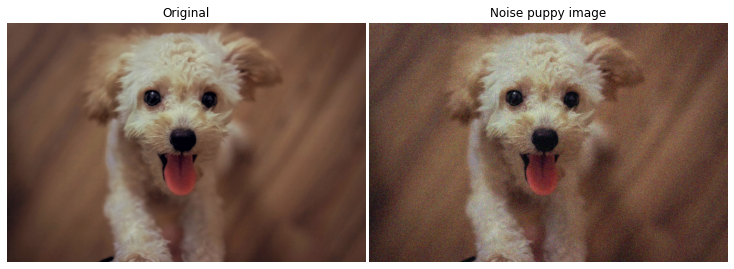

In [192]:
from skimage.util import random_noise

pup = imread("images/pup.jpg")

noisy_pup = random_noise(pup)

compare(pup, noisy_pup, "Noise puppy image")

### 3. Reducing noise - denoising

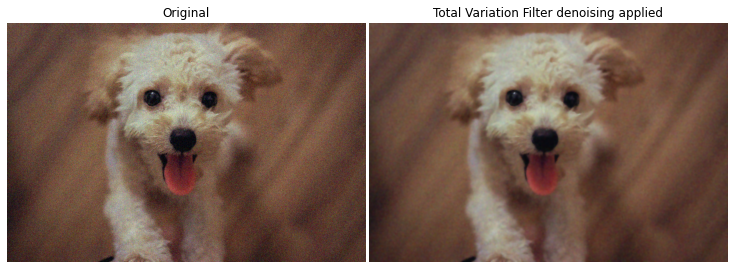

In [193]:
from skimage.restoration import denoise_tv_chambolle

denoised_pup_tv = denoise_tv_chambolle(noisy_pup, weight=0.2, multichannel=True)

compare(noisy_pup, denoised_pup_tv, "Total Variation Filter denoising applied")

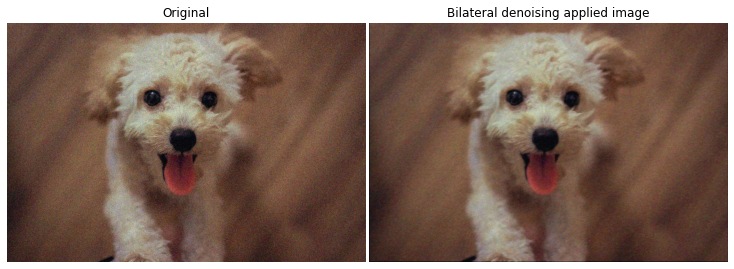

In [194]:
from skimage.restoration import denoise_bilateral

denoised_pup_bilateral = denoise_bilateral(noisy_pup, multichannel=True)

compare(noisy_pup, denoised_pup_bilateral, "Bilateral denoising applied image")

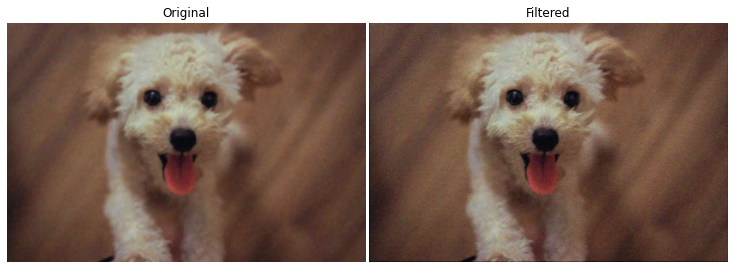

In [195]:
compare(denoised_pup_tv, denoised_pup_bilateral)

### 4. Superpixels and Segmentation

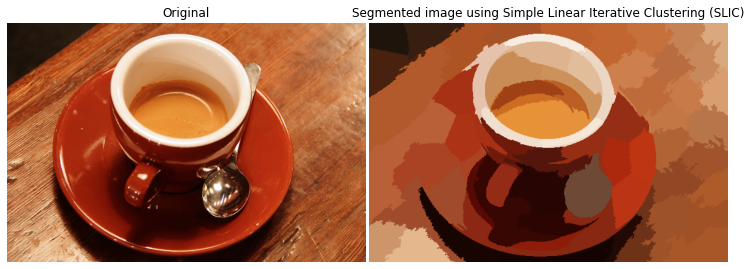

In [196]:
from skimage import data
from skimage.color import label2rgb
from skimage.segmentation import slic

coffee = data.coffee()


def segment(image, n_segments=100):
    # Obtain superpixels / segments
    superpixels = slic(coffee, n_segments=n_segments)

    # Put the groups on top of the original image
    segmented_image = label2rgb(superpixels, image, kind="avg")

    return segmented_image


segmented_coffee = segment(coffee)

compare(
    coffee,
    segmented_coffee,
    "Segmented image using Simple Linear Iterative Clustering (SLIC)",
)

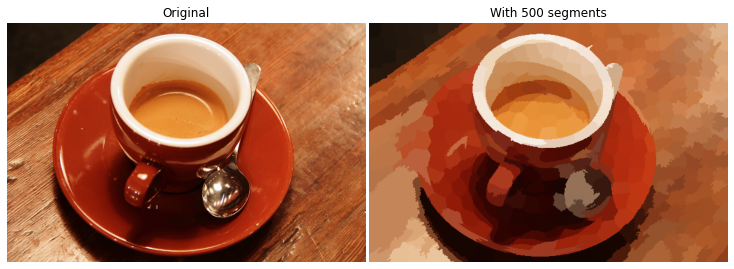

In [197]:
coffee_segmented_2 = segment(coffee, n_segments=500)

compare(coffee, coffee_segmented_2, "With 500 segments")

### 5. Contours

In [198]:
from skimage.filters import threshold_otsu
from skimage.measure import find_contours

dominoes = imread("images/dominoes.jpg")
# dominoes = denoise_tv_chambolle(dominoes, multichannel=True)


def contours(image):
    """A function to find contours from an image"""
    gray_image = rgb2gray(image)
    # Find optimal threshold
    thresh = threshold_otsu(gray_image)
    # Mask
    binary_image = gray_image > thresh

    contours = find_contours(binary_image)

    return contours

In [199]:
domino_contours = contours(dominoes)

for contour in domino_contours[:5]:
    print(contour.shape)

(371, 2)
(376, 2)
(4226, 2)
(177, 2)
(11, 2)


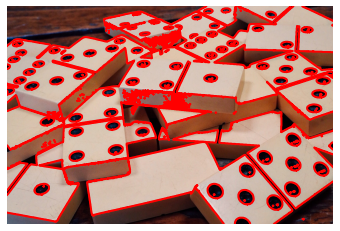

In [200]:
def plot_image_contours(image):
    fig, ax = plt.subplots()

    ax.imshow(image, cmap=plt.cm.gray)

    for contour in contours(image):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red")

    ax.axis("off")


plot_image_contours(dominoes)

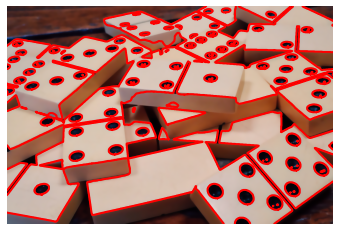

In [201]:
dominoes_denoised = denoise_tv_chambolle(dominoes, multichannel=True)

plot_image_contours(dominoes_denoised)

## Advanced operations

### 1. Edge detection

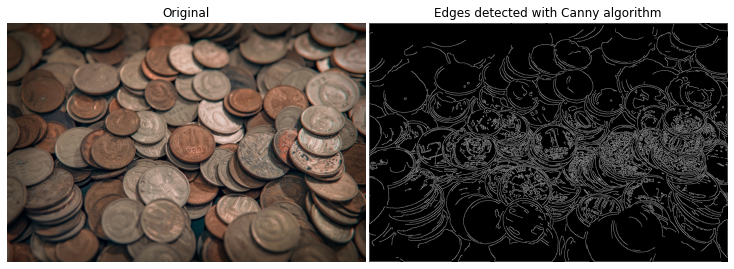

In [202]:
from skimage.feature import canny

coins_3 = imread("images/coins_3.jpg")

# Convert to gray
coins_3_gray = rgb2gray(coins_3)

# Find edges with canny
canny_edges = canny(coins_3_gray)

compare(coins_3, canny_edges, "Edges detected with Canny algorithm")

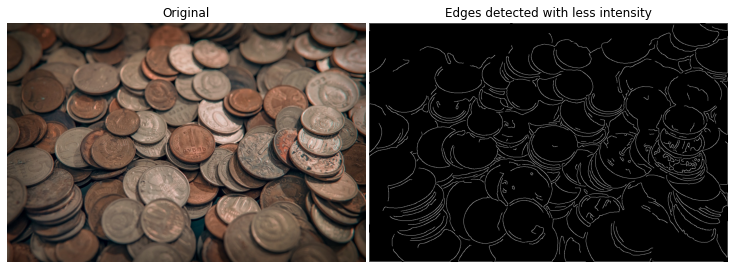

In [203]:
canny_edges_sigma_2 = canny(coins_3_gray, sigma=2.5)

compare(coins_3, canny_edges_sigma_2, "Edges detected with less intensity")

### 2. Corner detection

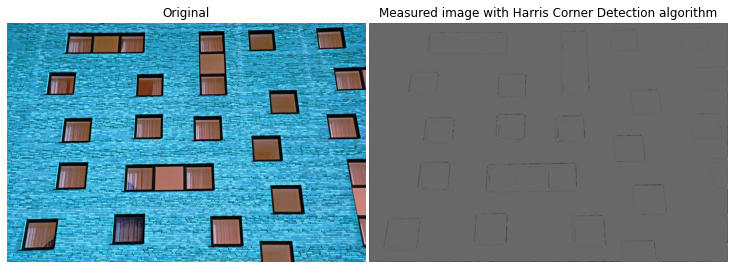

In [204]:
from skimage.feature import corner_harris

windows = imread("images/windows.jpg")
windows_denoised = denoise_tv_chambolle(windows, multichannel=True, weight=0.3)

windows_gray = rgb2gray(windows_denoised)

measured_image = corner_harris(windows_gray)

compare(
    windows, measured_image, "Measured image with Harris Corner Detection algorithm"
)

In [205]:
from skimage.feature import corner_peaks

corner_coords = corner_peaks(corner_harris(windows_gray), min_distance=50)

print(len(corner_coords))

84


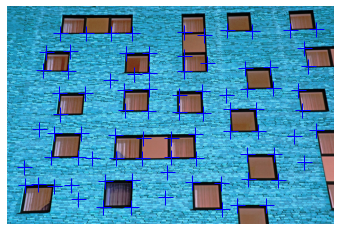

In [206]:
def show_image_cornered(image, coords):
    plt.imshow(image, cmap="gray")
    plt.plot(coords[:, 1], coords[:, 0], "+b", markersize=15)
    plt.axis("off")


show_image_cornered(windows, corner_coords)